In [1]:
import importlib
import datetime as dt
import math

import matplotlib.pyplot as plt

import numpy as np

import pandas as pd

from scipy import stats

import plotly.graph_objects as ptly
import plotly.express as px

import toolbox as tb


import sys
sys.path.insert(0, "..")

import waldluft as wl

plt.style.use("janjo-v0-0.mplstyle")

In [2]:
inst = wl.Timed("raw_data/221218", encoding="iso8859-1")

Successfully imported the following sensor data from raw_data/221218:
    WTDL:
        W1  | W1.csv
        W2  | W2_recovered.csv
        W3  | W3.csv
        W4  | W4_recovered.csv
        W5  | W5.csv
        W6  | W6.csv
        W7  | W7.csv
        W8  | W8.csv
        W9  | W9.csv
    SHT:
        S1  | S1.edf               | 98:2B


In [3]:
inst2 = wl.Timed("raw_data/220905", encoding="iso8859-1")

Successfully imported the following sensor data from raw_data/220905:
    WTDL:
        W1  | W1.csv
        W2  | W2.csv
        W3  | W3.csv
        W4  | W4.csv
        W5  | W5.csv
        W6  | W6.csv
        W7  | W7.csv
        W8  | W8.csv
        W9  | W9.csv
    SHT:
        S1  | S1.edf               | 98:2B
        S2  | S2.edf               | B1:5B
        S3  | S3.edf               | A5:6D
        S7  | S7.edf               | 79:D0
        S8  | S8.edf               | E1:E1
        S9  | S9.edf               | CD:A2


/Users/Janjo/Documents/MEINE DOKUMENTE/Projects/toolbox/toolbox/iter.py:110: UserWarning:

zip's strict mode not supported in Python<3.10.

Falling back to non-strict mode.

/Users/Janjo/Documents/MEINE DOKUMENTE/Projects/toolbox/toolbox/plot.py:1535: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



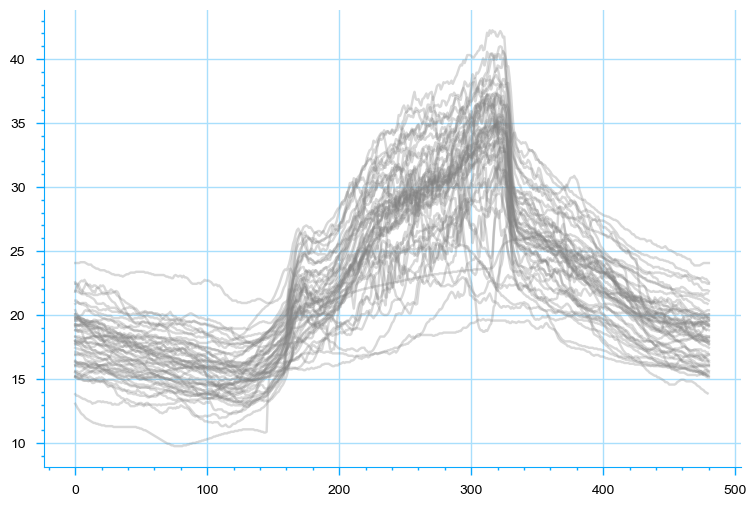

In [85]:
startdate = dt.datetime(2022, 7, 6)

starttime = 0
delta = 24

days = 50

fig = tb.plot.Plot(interactive=False, legend_loc=False)

for dayoffset in range(days):
    start = startdate + dt.timedelta(days=dayoffset, hours=starttime)
    end = start + dt.timedelta(hours=delta)
    
    filtered = inst.timeseries["W1"][
        start.strftime("%Y-%m-%d %H:%M:%S.%f"):
        end.strftime("%Y-%m-%d %H:%M:%S.%f")
    ]
    
    fig.add_line(filtered["T"], color="grey", opacity=0.3)
    
fig.post_process()
fig

In [114]:
inst2.timeseries["S2"][dt.datetime(2022,7,12).strftime("%Y-%m-%d %H:%M:%S.%f"):dt.datetime(2022,7,13).strftime("%Y-%m-%d %H:%M:%S.%f")]["T"].mean()

23.693783333333332

invalid day: 4
invalid day: 5
invalid day: 6
invalid day: 7
invalid day: 8
invalid day: 9
invalid day: 10
invalid day: 11
invalid day: 12
invalid day: 13
invalid day: 14
invalid day: 15
invalid day: 16
invalid day: 17
invalid day: 18
invalid day: 19
invalid day: 20
invalid day: 21
invalid day: 22
invalid day: 23
invalid day: 24
invalid day: 25
invalid day: 26
invalid day: 27
invalid day: 28
invalid day: 29
invalid day: 30
invalid day: 31
invalid day: 32
invalid day: 33
invalid day: 34
invalid day: 35
invalid day: 36
invalid day: 37
invalid day: 38
invalid day: 39
invalid day: 40
invalid day: 41
invalid day: 42
invalid day: 43
invalid day: 44
invalid day: 45
invalid day: 46
invalid day: 47
invalid day: 48
invalid day: 49
invalid day: 50
invalid day: 51
invalid day: 52
invalid day: 53
invalid day: 54
invalid day: 55
invalid day: 56
invalid day: 57
invalid day: 58
invalid day: 59
invalid day: 60
invalid day: 61
invalid day: 62
invalid day: 63
invalid day: 64
invalid day: 65
invalid day: 6

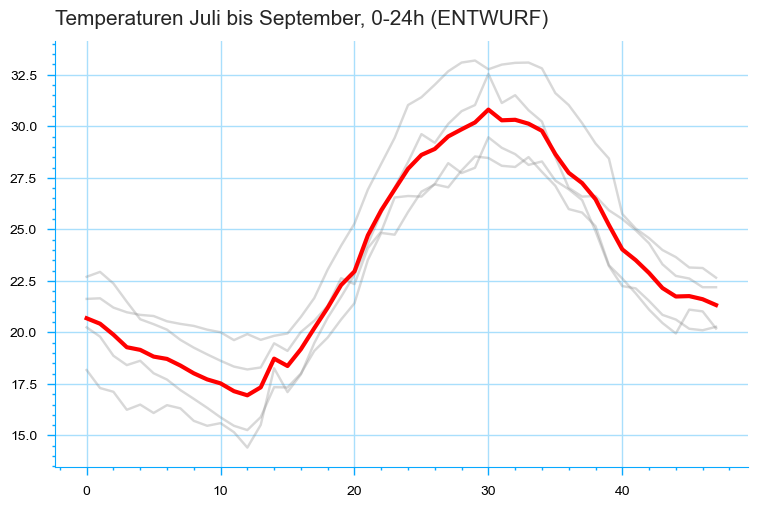

In [124]:
startdate = dt.datetime(2022, 7, 13)

starttime = 0
delta = 24

bins_min = 30

days = 90


fig = tb.plot.Plot(
    interactive=False,
    title="Temperaturen Juli bis September, 0-24h (ENTWURF)",
    legend_loc=False,
)


n_bins = math.floor(delta * 60 / bins_min)
binned = np.zeros(n_bins)
summed = np.zeros(n_bins)
valid_days = 0

for day in range(days):
    start = startdate + dt.timedelta(days=day, hours=starttime)
    
    for i in range(n_bins):
        binned[i] = inst2.timeseries["S3"][
            (start + dt.timedelta(minutes=(i*bins_min))).strftime("%Y-%m-%d %H:%M:%S.%f"):
            (start + dt.timedelta(minutes=(i*bins_min + 1))).strftime("%Y-%m-%d %H:%M:%S.%f")
        ]["T"].mean()
    
    if(np.isnan(binned).any()):
        print("invalid day:", day)
        continue
    else:
        valid_days += 1
    
    summed = summed + binned
    
    fig.add_line(binned, color="grey", opacity=0.3)
    
fig.add_line(summed / valid_days, color="red", opacity=1., lw=3)

fig.post_process()

fig

In [28]:
def mpl_custom_func(starttime, delta, n_bins):
    def inner(fig, ax):
        ax[0,0].set_xticks(
            np.linspace(0, n_bins, delta+1),
            [
                str(i) if i < 24 else str(i-24)
                for i
                in range(starttime, starttime+delta+1)
            ]
        )
        return fig, ax
    return inner
        

invalid day: 0
invalid day: 1
invalid day: 2
invalid day: 3
invalid day: 4
invalid day: 5
invalid day: 6
invalid day: 7
invalid day: 8
invalid day: 9
invalid day: 10


Unable to render javascript-based plotly plot. 
 Call toolbox.plot.init_notebook_mode() or re-run this cell. 
 If viewing on GitHub, render the notebook in
 
 NBViewer instead.

invalid day: 0
invalid day: 1
invalid day: 2
invalid day: 3
invalid day: 4
invalid day: 5
invalid day: 6
invalid day: 7
invalid day: 8
invalid day: 9
invalid day: 10
saved figure at graphics_demo/Juli_Aug_ueberlagert.png


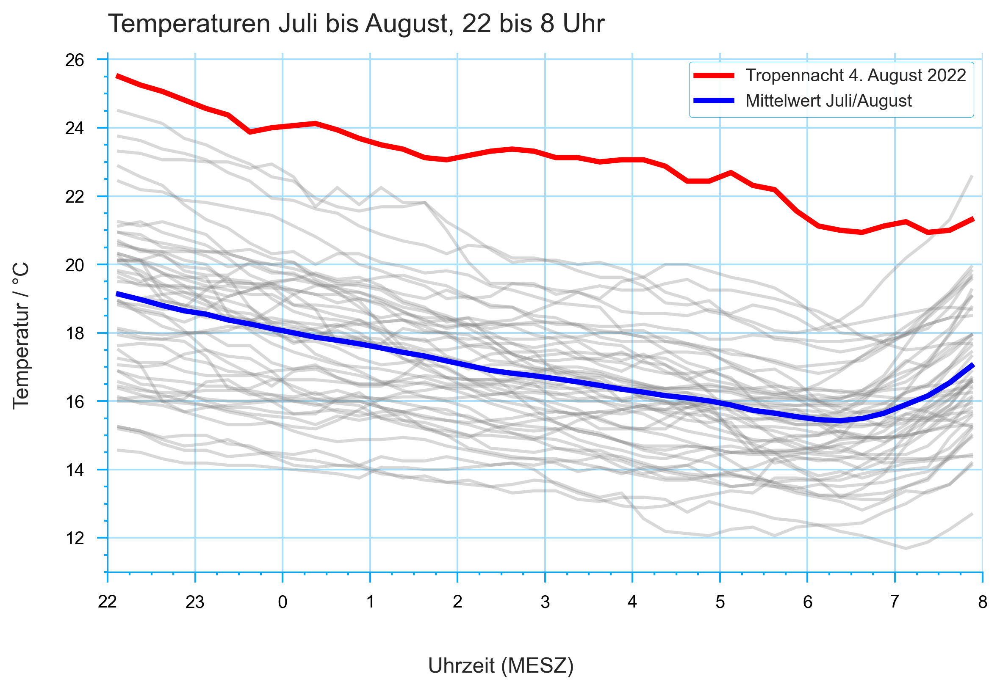

In [45]:
for interactive in (True, False):
    startdate = dt.datetime(2022, 7, 6)

    starttime = 22
    delta = 10

    bins_min = 15

    days = 60

    n_bins = math.floor(delta * 60 / bins_min)

    x = np.arange(n_bins) + 0.5


    fig = tb.plot.Plot(
        interactive=interactive,
        xlim=(0.5, n_bins - 0.5),
        title="Temperaturen Juli bis August, 22 bis 8 Uhr",
        xlabel="Uhrzeit (MESZ)",
        ylabel="Temperatur / °C",
        dpi=300,
        mpl_custom_func=mpl_custom_func(starttime, delta, n_bins),
    )


    binned = np.zeros((days, n_bins))

    valid_days = 0

    for day in range(days):
        start = startdate + dt.timedelta(days=day, hours=starttime)

        for i in range(n_bins):
            binned[day, i] = inst.timeseries["W1"][
                (start + dt.timedelta(minutes=(i*bins_min))).strftime("%Y-%m-%d %H:%M:%S.%f"):
                (start + dt.timedelta(minutes=(i*bins_min + 1))).strftime("%Y-%m-%d %H:%M:%S.%f")
            ]["T"].mean()

        if(np.isnan(binned[day]).any()):
            print("invalid day:", day)
            binned[day, :] = 0
            continue
        else:
            valid_days += 1



        fig.add_line(x, binned[day], color="grey", opacity=0.3)

    fig.add_line(x, binned[29], color="red", opacity=1., label="Tropennacht 4. August 2022", linewidth=3)

    fig.add_line(x, binned.sum(axis=0) / valid_days, color="blue", opacity=1., linewidth=3, label="Mittelwert Juli/August")

    fig.post_process()

    fig.show()
fig.save("graphics_demo/Juli_Aug_ueberlagert.png")

invalid day: 0
invalid day: 1
invalid day: 2
invalid day: 3
invalid day: 4
invalid day: 5
invalid day: 6
invalid day: 7
invalid day: 8
invalid day: 9
invalid day: 10


Unable to render javascript-based plotly plot. 
 Call toolbox.plot.init_notebook_mode() or re-run this cell. 
 If viewing on GitHub, render the notebook in
 
 NBViewer instead.

invalid day: 0
invalid day: 1
invalid day: 2
invalid day: 3
invalid day: 4
invalid day: 5
invalid day: 6
invalid day: 7
invalid day: 8
invalid day: 9
invalid day: 10
saved figure at graphics_demo/Juli_Aug_zwei_Linien.png


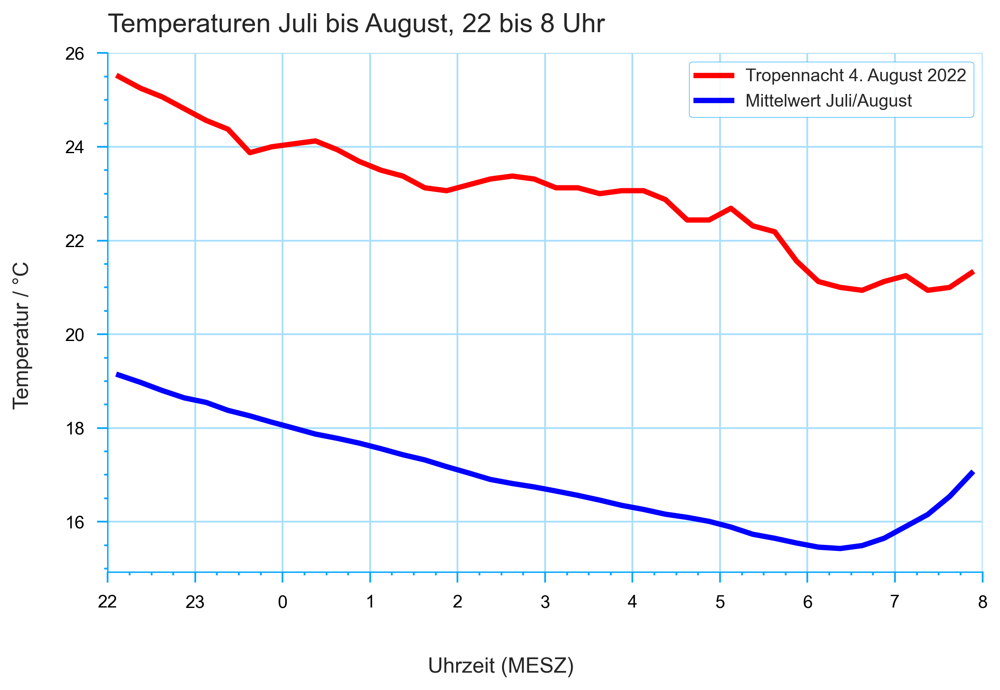

In [46]:
for interactive in (True, False):
    startdate = dt.datetime(2022, 7, 6)

    starttime = 22
    delta = 10

    bins_min = 15

    days = 60

    n_bins = math.floor(delta * 60 / bins_min)

    x = np.arange(n_bins) + 0.5


    fig = tb.plot.Plot(
        interactive=interactive,
        xlim=(0.5, n_bins - 0.5),
        title="Temperaturen Juli bis August, 22 bis 8 Uhr",
        xlabel="Uhrzeit (MESZ)",
        ylabel="Temperatur / °C",
        dpi=300,
        mpl_custom_func=mpl_custom_func(starttime, delta, n_bins),
    )


    binned = np.zeros((days, n_bins))

    valid_days = 0

    for day in range(days):
        start = startdate + dt.timedelta(days=day, hours=starttime)

        for i in range(n_bins):
            binned[day, i] = inst.timeseries["W1"][
                (start + dt.timedelta(minutes=(i*bins_min))).strftime("%Y-%m-%d %H:%M:%S.%f"):
                (start + dt.timedelta(minutes=(i*bins_min + 1))).strftime("%Y-%m-%d %H:%M:%S.%f")
            ]["T"].mean()

        if(np.isnan(binned[day]).any()):
            print("invalid day:", day)
            binned[day, :] = 0
            continue
        else:
            valid_days += 1



        #fig.add_line(x, binned[day], color="grey", opacity=0.3)

    fig.add_line(x, binned[29], color="red", opacity=1., label="Tropennacht 4. August 2022", linewidth=3)

    fig.add_line(x, binned.sum(axis=0) / valid_days, color="blue", opacity=1., linewidth=3, label="Mittelwert Juli/August")

    fig.post_process()

    fig.show()
fig.save("graphics_demo/Juli_Aug_zwei_Linien.png")

In [6]:
test = np.zeros(3)

In [8]:
test[:] = 3

In [18]:
filtered

,Zeit [s],T
timestamp,,
2022-07-06 00:02:00,06.07.2022 00:02:00,13.063
2022-07-06 00:05:00,06.07.2022 00:05:00,12.875
2022-07-06 00:08:00,06.07.2022 00:08:00,12.688
2022-07-06 00:11:00,06.07.2022 00:11:00,12.563
2022-07-06 00:14:00,06.07.2022 00:14:00,12.375
...,...,...
2022-07-06 23:47:00,06.07.2022 23:47:00,15.500
2022-07-06 23:50:00,06.07.2022 23:50:00,15.375
2022-07-06 23:53:00,06.07.2022 23:53:00,15.438


In [19]:
tb.plot.line(filtered["T"])

/Users/Janjo/Documents/MEINE DOKUMENTE/Projects/toolbox/toolbox/iter.py:110: UserWarning:

zip's strict mode not supported in Python<3.10.

Falling back to non-strict mode.



In [11]:
inst.timeseries

{'W6':                                  Zeit [s]       T
 timestamp                                        
 2022-07-05 22:54:00   05.07.2022 22:54:00  25.875
 2022-07-05 22:57:00   05.07.2022 22:57:00  27.625
 2022-07-05 23:00:00   05.07.2022 23:00:00  27.438
 2022-07-05 23:03:00   05.07.2022 23:03:00  27.625
 2022-07-05 23:06:00   05.07.2022 23:06:00  27.438
 ...                                   ...     ...
 2022-09-05 20:33:00   05.09.2022 20:33:00  20.875
 2022-09-05 20:36:00   05.09.2022 20:36:00  20.813
 2022-09-05 20:39:00   05.09.2022 20:39:00  20.938
 2022-09-05 20:42:00   05.09.2022 20:42:00  21.000
 2022-09-05 20:45:00   05.09.2022 20:45:00  21.063
 
 [29718 rows x 2 columns],
 'W7':                                  Zeit [s]       T
 timestamp                                        
 2022-07-05 22:55:00   05.07.2022 22:55:00  25.875
 2022-07-05 22:58:00   05.07.2022 22:58:00  27.500
 2022-07-05 23:01:00   05.07.2022 23:01:00  27.375
 2022-07-05 23:04:00   05.07.2022 23:04:0

In [9]:
dir(inst)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_import_sht_file',
 '_import_wtld_file',
 '_parse_sht_datetime',
 '_parse_wtdl_datetime',
 '_plot_regression',
 '_plt_export',
 '_plt_finish',
 '_plt_init',
 '_sensor_selection',
 'binned_delta',
 'dateseries',
 'extract_dateseries',
 'filenames',
 'plot_dateseries_interactive',
 'plot_temp_time',
 'plot_temp_time_interactive',
 'plot_temp_time_old',
 'sensor_labels',
 'sht_int',
 'sht_metadata',
 'sht_sn',
 'sht_str',
 'timeseries',
 'wtdl_int',
 'wtdl_str']

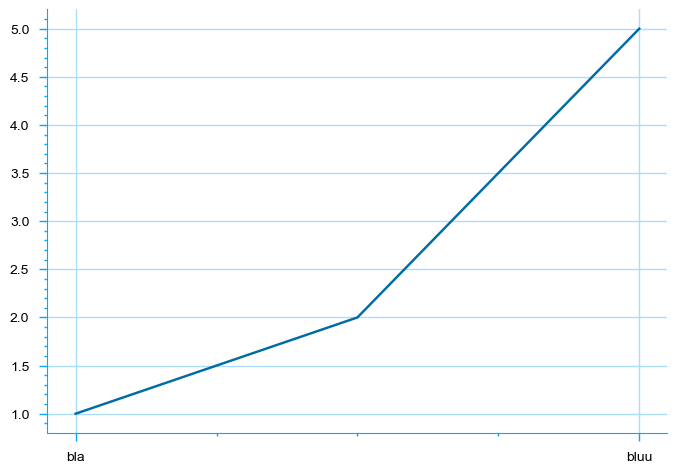

In [12]:
fig, ax = plt.subplots()
ax.plot((1,2,5))
ax.set_xticks((0,2), ("bla", "bluu"))